## "Unveiling India's Financial Giants: Stock Market Analysis of the Top 4 Banks"

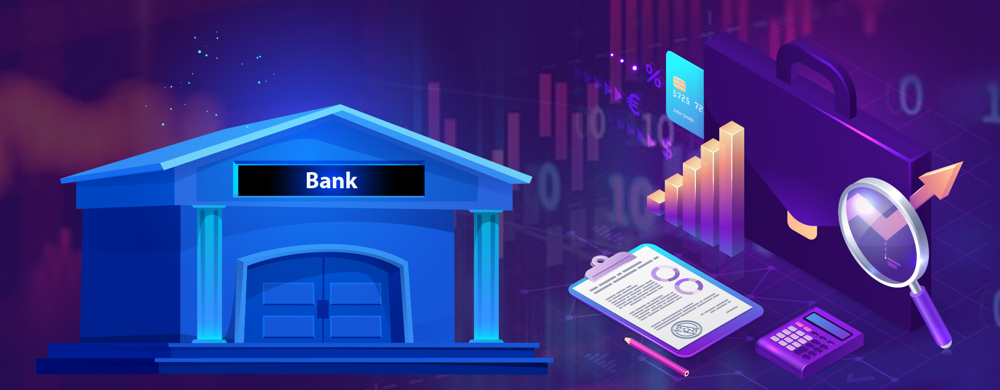

### > 'STATE BANK OF INDIA'- SBIN
### > 'HOUSING DEVELOPMENT FINANCE CORPLTD'- HDFCBANK
### > 'ICICI BANK LTD'-  ICICIBANK
### > 'KOTAK MAHINDRA BANK LTD'- KOTAKBANK

## Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates
import plotly.express  as px
import plotly.tools as tls
import plotly.graph_objects as go
import os
import warnings
warnings.filterwarnings('ignore')

## Reading Directory using OS module

In [2]:
os.listdir(r'D:\Dataset\Time Series Analysis\Stock market Analysis')

['.ipynb_checkpoints',
 '2560px-State_Bank_of_India_logo.svg.png',
 '5-Parameters-To-Analyse-Banking-Stocks-01.jpg',
 'HDFCBANK.csv',
 'ICICIBANK.csv',
 'KOTAKBANK.csv',
 'SBI-Logo-1970.png',
 'SBI-Logo.png',
 'sbi2023.csv',
 'SBIN.csv',
 'TOP  5 Indian Bank last 5 year Stock Market Analysis.ipynb',
 'Untitled.ipynb']

## Listing all csv file

In [3]:
 bank_list=['SBIN.csv','HDFCBANK.csv','ICICIBANK.csv','KOTAKBANK.csv']

In [4]:
path=r'D:\Dataset\Time Series Analysis\Stock market Analysis'
all_bank=pd.DataFrame() # form empty dataframe to store all csv fiel in one frame

In [5]:
for file in bank_list:
    cur_df= pd.read_csv(path+'/'+ file)
    all_bank= pd.concat([all_bank, cur_df])

In [6]:
all_bank.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Name
0,01 January 2018,310.000000,312.750000,306.500000,307.049988,299.568726,1725476,SBIN
1,02 January 2018,308.100006,308.850006,301.649994,302.899994,295.519836,1188380,SBIN
2,03 January 2018,304.899994,306.399994,302.149994,302.850006,295.471069,806325,SBIN
3,04 January 2018,304.000000,309.899994,303.000000,308.049988,300.544373,2863595,SBIN
4,05 January 2018,311.000000,311.799988,305.600006,306.200012,298.739471,1897329,SBIN


## Changine datatype of date column in Datetime dtype

In [8]:
all_bank['Date']= pd.to_datetime(all_bank['Date'])

## Make date column as index

In [9]:
all_bank.set_index('Date',inplace=True)

In [10]:
all_bank.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4944 entries, 2018-01-01 to 2022-12-30
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       4944 non-null   float64
 1   High       4944 non-null   float64
 2   Low        4944 non-null   float64
 3   Close      4944 non-null   float64
 4   Adj Close  4944 non-null   float64
 5   Volume     4944 non-null   int64  
 6   Name       4944 non-null   object 
dtypes: float64(5), int64(1), object(1)
memory usage: 309.0+ KB


## Adding extra feature to dataframe

In [11]:
all_bank['Year']=all_bank.index.year
all_bank['Quarter']=all_bank.index.quarter

In [12]:
all_bank.head()

,Open,High,Low,Close,Adj Close,Volume,Name,Year,Quarter
Date,,,,,,,,,
2018-01-01,310.000000,312.750000,306.500000,307.049988,299.568726,1725476,SBIN,2018,1
2018-01-02,308.100006,308.850006,301.649994,302.899994,295.519836,1188380,SBIN,2018,1
2018-01-03,304.899994,306.399994,302.149994,302.850006,295.471069,806325,SBIN,2018,1
2018-01-04,304.000000,309.899994,303.000000,308.049988,300.544373,2863595,SBIN,2018,1
2018-01-05,311.000000,311.799988,305.600006,306.200012,298.739471,1897329,SBIN,2018,1


## Making list of Bank 

In [13]:
bankslist=all_bank['Name'].unique()

In [14]:
all_bank.head()

,Open,High,Low,Close,Adj Close,Volume,Name,Year,Quarter
Date,,,,,,,,,
2018-01-01,310.000000,312.750000,306.500000,307.049988,299.568726,1725476,SBIN,2018,1
2018-01-02,308.100006,308.850006,301.649994,302.899994,295.519836,1188380,SBIN,2018,1
2018-01-03,304.899994,306.399994,302.149994,302.850006,295.471069,806325,SBIN,2018,1
2018-01-04,304.000000,309.899994,303.000000,308.049988,300.544373,2863595,SBIN,2018,1
2018-01-05,311.000000,311.799988,305.600006,306.200012,298.739471,1897329,SBIN,2018,1


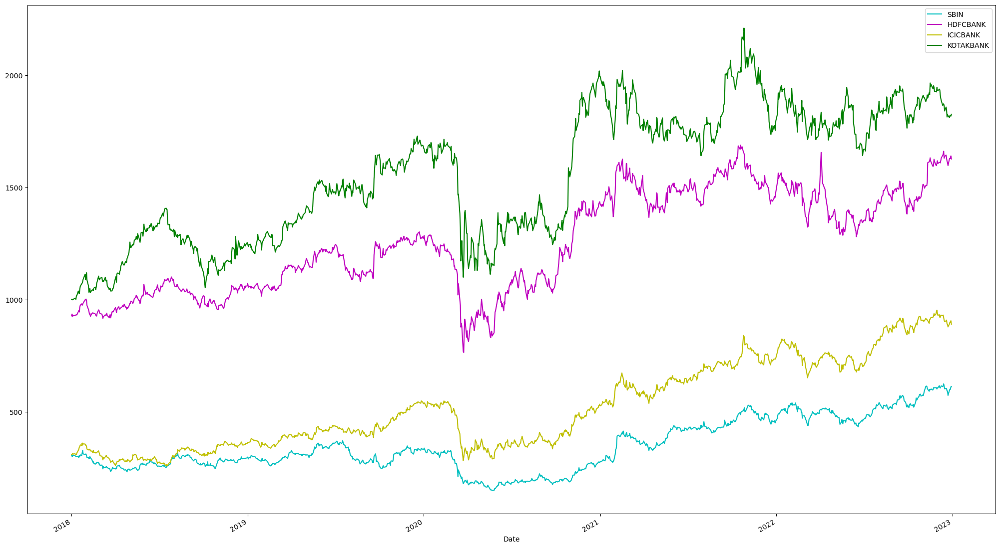

In [117]:
plt.figure(figsize=(25,15))
color=['r','c','m','y','g']
for index,bank in enumerate(bankslist,1):
    #plt.subplot(2,2,index)
    df=all_bank[all_bank['Name']==bank]
    df['Close'].plot(kind="line",c=color[index],label=bank)
    plt.legend()
    fig=px.line( df['Close'],title=bank+" "+ "CLOSING PRICE")
    fig.show()
    

- During Pandamic 2020–2021, all the bank stocks get affected, and we see a sharp decline in stock prices.

## Analysing volume of Stocks

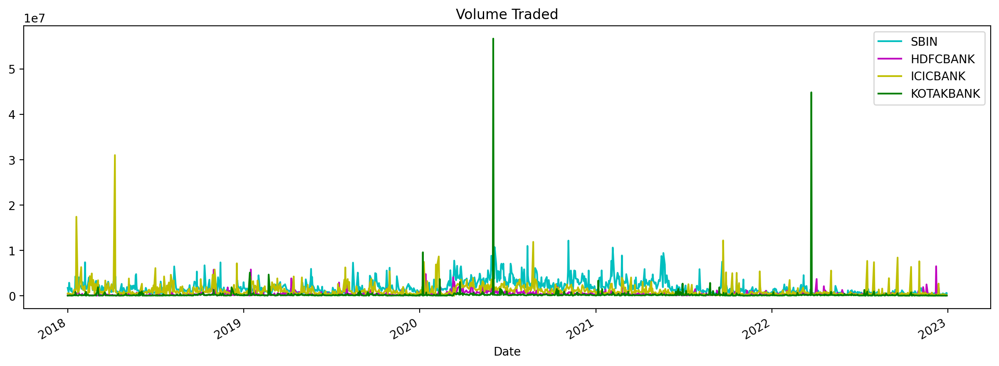

In [16]:
plt.figure(figsize=(15,5),dpi=200)
for index,bank in enumerate(bankslist,1):
    #plt.subplot(2,2,index)
    df=all_bank[all_bank['Name']==bank]
    
    df['Volume'].plot(c=color[index],label=bank,title='Volume Traded')
    plt.legend()
    fig=px.line( df['Volume'],title=bank+" "+ "VOLUME TRADED")
    fig.show()
    

- Hdfc and Kotak have the lowest volume traded, but on a particular Dates, Kotak showed the highest volume traded, which is the highest among all.
- SBI and ICIC Bank stocks showed a high volume of trading.
- During the pandemic period, due to the decline in stock prices, the volume traded in all stocks was on the rise. SBI stocks showed the highest volume traded for that period.

## Analysing 1day % return

In [17]:
all_bank['1day % return']=((all_bank['Close']-all_bank['Open'])/all_bank['Close'])*100

In [18]:
all_bank.head()

,Open,High,Low,Close,Adj Close,Volume,Name,Year,Quarter,1day % return
Date,,,,,,,,,,
2018-01-01,310.000000,312.750000,306.500000,307.049988,299.568726,1725476,SBIN,2018,1,-0.960760
2018-01-02,308.100006,308.850006,301.649994,302.899994,295.519836,1188380,SBIN,2018,1,-1.716742
2018-01-03,304.899994,306.399994,302.149994,302.850006,295.471069,806325,SBIN,2018,1,-0.676899
2018-01-04,304.000000,309.899994,303.000000,308.049988,300.544373,2863595,SBIN,2018,1,1.314718
2018-01-05,311.000000,311.799988,305.600006,306.200012,298.739471,1897329,SBIN,2018,1,-1.567599


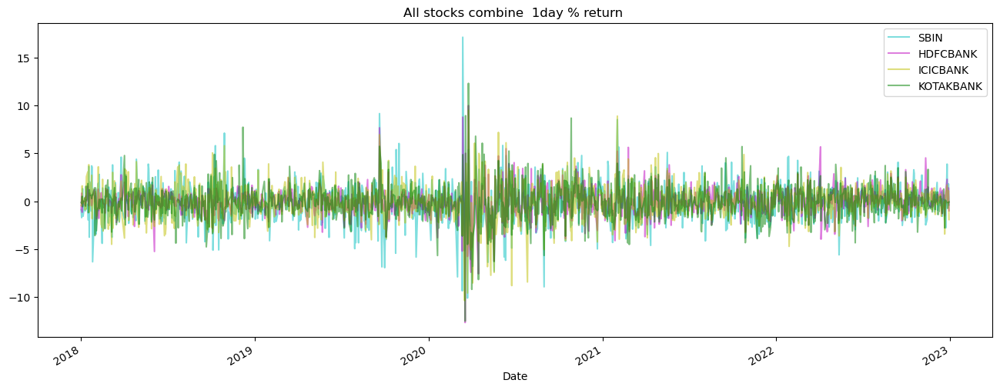

In [19]:
#plt.figure(figsize=(20,15))
for index,bank in enumerate(bankslist,1):
    df=all_bank[all_bank['Name']==bank]
    df['1day % return'].plot(figsize=(16,6),c=color[index],title='All stocks combine  1day % return ',label=bank,alpha=0.5)
    plt.legend()
    fig=px.line(df['1day % return'],title=bank,template='plotly_white')
    fig.show()
 

## Grouping the Stocks based on Quarter and year

In [20]:
year_quarter=all_bank.groupby(['Name','Year','Quarter'])['Close'].mean()

In [21]:
# sbi_stock=year_quater['SBIN'].values
# df_stock=pd.DataFrame(sbi_stock.reshape(5,4),index=list(range(2018,2023)),columns=['Q1','Q2','Q3','Q4'])
# df_stock.head().

## Quarter Wise Analysis of Stocks

In [22]:
for index,bank in enumerate(bankslist,1):
    qstock=year_quarter[bank].values
    df_stock=pd.DataFrame(qstock.reshape(5,4),index=list(range(2018,2023)),columns=['Q1','Q2','Q3','Q4'])
    fig=px.bar(df_stock,title=bank,template='plotly_white')
    fig1=px.line(df_stock,title=bank,template='plotly_dark')
    fig.show()
    fig1.show()

## Analyzing Monthly Average Closing Price

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


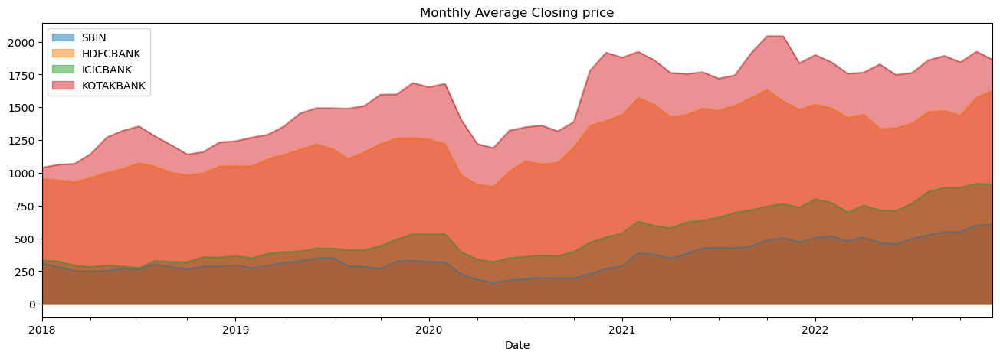

In [118]:
plt.figure(figsize=(16,5))
for index,bank in enumerate(bankslist,1):
    #plt.subplot(2,2,index)
    df=all_bank[all_bank['Name']==bank]
    fig=px.line(df['Close'].resample('M').mean(),title=bank+" "+'Monthly Average Closing price')
    plt.legend()
    df['Close'].resample('M').mean().plot(kind='area',label=bank,stacked=False)
    plt.title('Monthly Average Closing price')
    plt.legend()
    fig.show()

## Analyzing Yearly closing price

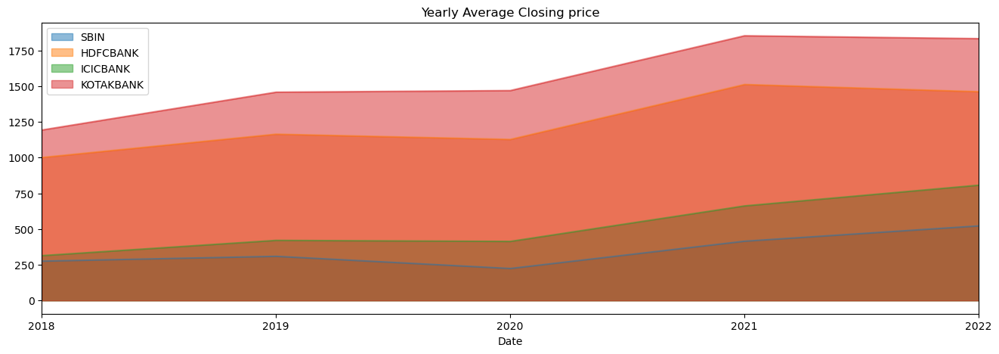

In [119]:
plt.figure(figsize=(16,5))
for index,bank in enumerate(bankslist,1):
    #plt.subplot(2,2,index)
    df=all_bank[all_bank['Name']==bank]
    df['Close'].resample('Y').mean().plot(kind='area',label=bank,title='Yearly Average Closing price',stacked=False)
    
    fig=px.line(df['Close'].resample('Y').mean(),title=bank+" "+'Yearly Average Closing price')
    plt.legend()
    fig.show()

## Making Closing price DataFrame

In [25]:
bank_list

['SBIN.csv', 'HDFCBANK.csv', 'ICICIBANK.csv', 'KOTAKBANK.csv']

In [26]:
path

'D:\\Dataset\\Time Series Analysis\\Stock market Analysis'

In [27]:
def read_data(path, filename):
    return pd.read_csv(path+'/'+filename)

In [28]:
sbi=read_data(path,bank_list[0])

In [29]:
hdfc=read_data(path,bank_list[1])

In [30]:
icic=read_data(path,bank_list[2])

In [31]:
kotak=read_data(path,bank_list[3])

### Forming bank Closing Price dataframe

In [32]:
close_price_df=pd.DataFrame()

In [33]:
close_price_df['sbi_closing_price']=sbi['Close']
close_price_df['hdfc_closing_price']=hdfc['Close']
close_price_df['icic_closing_price']=icic['Close']
close_price_df['kotak_closing_price']=kotak['Close']                                     
                                

In [34]:
close_price_df.index=all_bank.index[:1236]

In [35]:
close_price_df

,sbi_closing_price,hdfc_closing_price,icic_closing_price,kotak_closing_price
Date,,,,
2018-01-01,307.049988,928.500000,310.549988,1001.650024
2018-01-02,302.899994,936.349976,309.250000,1002.599976
2018-01-03,302.850006,926.325012,315.049988,1000.049988
2018-01-04,308.049988,928.650024,314.799988,1000.299988
2018-01-05,306.200012,930.224976,312.600006,1003.049988
...,...,...,...,...
2022-12-26,596.750000,1628.150024,892.400024,1811.699951
2022-12-27,601.849976,1630.650024,900.650024,1820.500000
2022-12-28,601.200012,1629.449951,898.700012,1820.250000


In [36]:
#close_price_df.plot(figsize=(16,6))
fig=px.line(close_price_df,title='Closing Price of Each bank on respective Date')
fig.update_layout(
    title={
        'text': "Closing Price of Each bank on respective Date",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()
#plt.xticks(np.arange(0, 1200, step=240))
#plt.xticks(['2018','2019','2020','2021','2022'])
#plt.xticks(ticks=[0,240,480,720,960],labels=['2018','2019','2020','2021','2022']);

In [37]:
close_price_df.head()

,sbi_closing_price,hdfc_closing_price,icic_closing_price,kotak_closing_price
Date,,,,
2018-01-01,307.049988,928.500000,310.549988,1001.650024
2018-01-02,302.899994,936.349976,309.250000,1002.599976
2018-01-03,302.850006,926.325012,315.049988,1000.049988
2018-01-04,308.049988,928.650024,314.799988,1000.299988
2018-01-05,306.200012,930.224976,312.600006,1003.049988


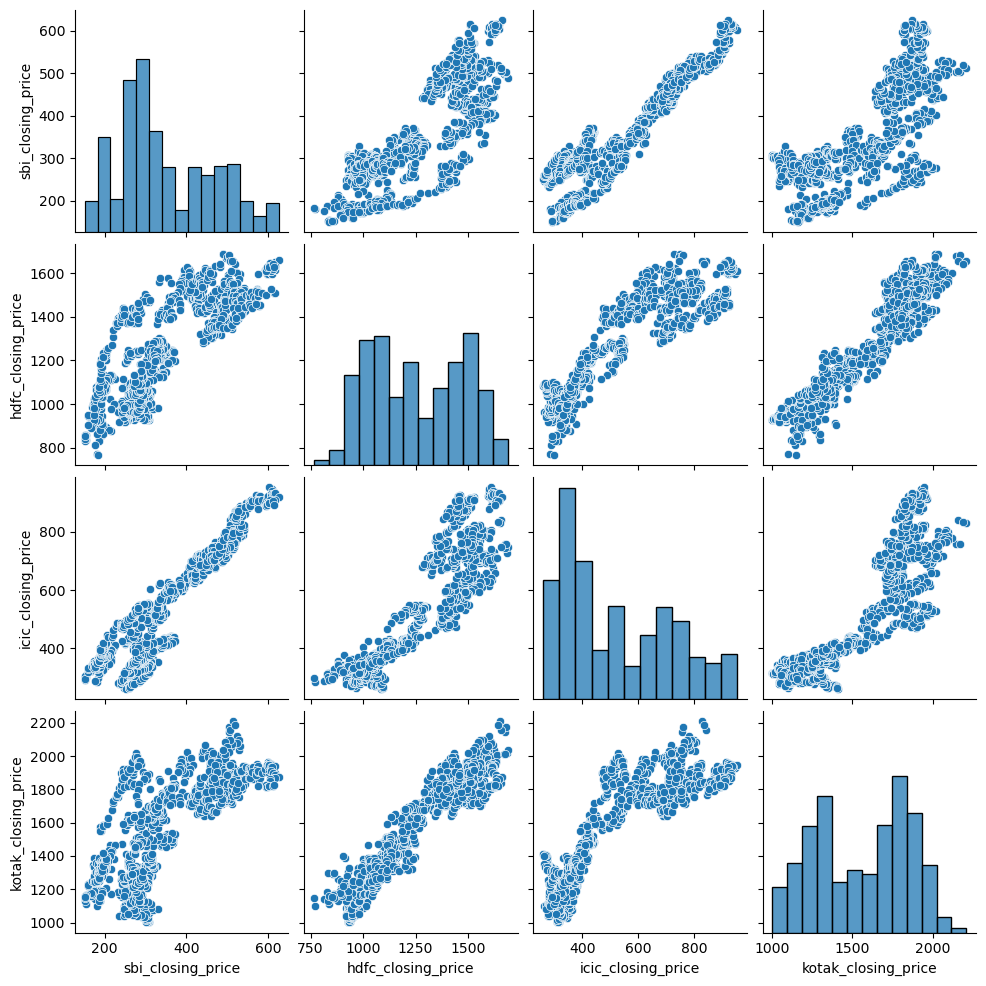

In [38]:
sns.pairplot(close_price_df)

###  Closing Price Correlation

<Axes: >

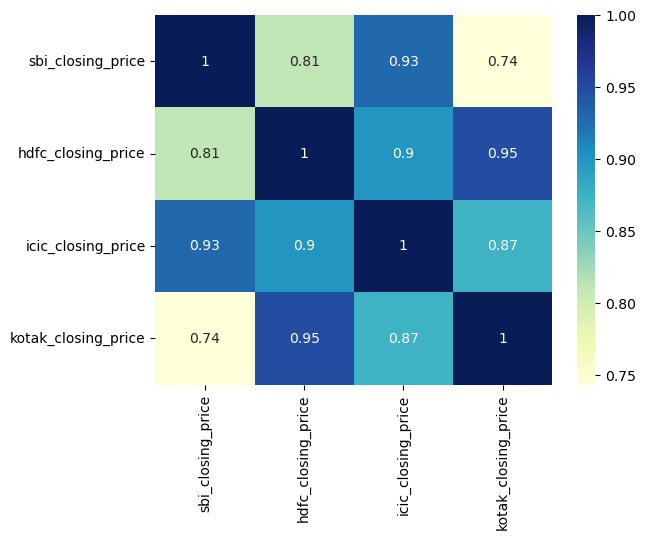

In [39]:
sns.heatmap(close_price_df.corr(),annot=True,cmap="YlGnBu")

## Total Traded

In [40]:
Total_trade=pd.DataFrame()

Total_trade['sbi_total_trade']=sbi['Open']*sbi['Volume']
Total_trade['hdfc_total_trade']=hdfc['Open']*hdfc['Volume']
Total_trade['icic_total_trade']=icic['Open']*icic['Volume']
Total_trade['kotak_total_trade']=kotak['Open']*kotak['Volume']

Total_trade.head()

,sbi_total_trade,hdfc_total_trade,icic_total_trade,kotak_total_trade
0,5.348976e+08,7.801607e+07,1.568121e+08,2.346619e+07
1,3.661399e+08,8.391678e+07,1.770926e+08,4.311852e+07
2,2.458485e+08,8.332554e+07,1.621812e+08,4.466654e+07
3,8.705329e+08,4.319293e+07,1.422345e+08,3.928028e+07
4,5.900693e+08,1.984631e+08,1.353898e+08,7.627309e+07


In [41]:
Total_trade.index=all_bank.index[:1236]

Total_trade.head()

,sbi_total_trade,hdfc_total_trade,icic_total_trade,kotak_total_trade
Date,,,,
2018-01-01,5.348976e+08,7.801607e+07,1.568121e+08,2.346619e+07
2018-01-02,3.661399e+08,8.391678e+07,1.770926e+08,4.311852e+07
2018-01-03,2.458485e+08,8.332554e+07,1.621812e+08,4.466654e+07
2018-01-04,8.705329e+08,4.319293e+07,1.422345e+08,3.928028e+07
2018-01-05,5.900693e+08,1.984631e+08,1.353898e+08,7.627309e+07


In [42]:
Total_trade.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1236 entries, 2018-01-01 to 2022-12-30
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   sbi_total_trade    1236 non-null   float64
 1   hdfc_total_trade   1236 non-null   float64
 2   icic_total_trade   1236 non-null   float64
 3   kotak_total_trade  1236 non-null   float64
dtypes: float64(4)
memory usage: 48.3 KB


In [43]:
#Total_trade.plot(figsize=(15,5))
fig=px.line(Total_trade,title='Total Trade')
fig.update_layout(
    title={
        'text': "Closing Price of Each bank on respective Date",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

In [44]:
Total_trade.idxmax()

sbi_total_trade     2021-02-05
hdfc_total_trade    2022-12-08
icic_total_trade    2021-09-22
kotak_total_trade   2022-03-24
dtype: datetime64[ns]

In [45]:
Total_trade.max()

sbi_total_trade      4.095850e+09
hdfc_total_trade     1.046848e+10
icic_total_trade     8.737208e+09
kotak_total_trade    7.684438e+10
dtype: float64

<Axes: >

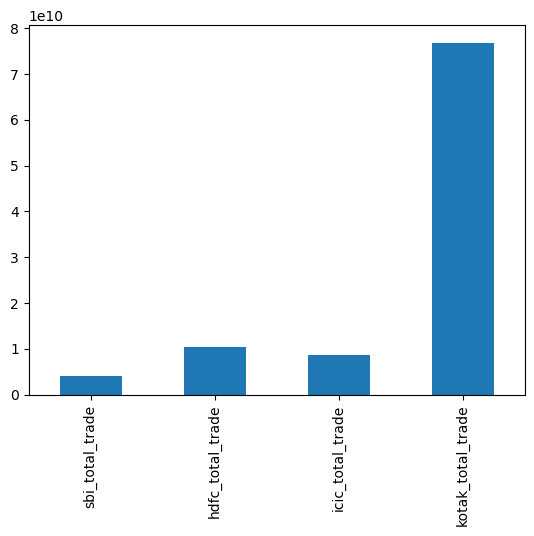

In [46]:
Total_trade.max().plot(kind="bar")

## daily_per_return

In [47]:
daily_per_return=pd.DataFrame()

In [48]:
daily_per_return['sbi_daily_per_returns'] = ((sbi['Close'] / sbi['Close'].shift(1) ) - 1)*100
daily_per_return['hdfc_daily_per_returns'] = ((hdfc['Close'] / hdfc['Close'].shift(1) ) - 1)*100
daily_per_return['icic_daily_per_returns'] = ((icic['Close'] / icic['Close'].shift(1) ) - 1)*100
daily_per_return['kotak_daily_per_returns'] = ((kotak['Close'] / kotak['Close'].shift(1) ) - 1)*100

In [49]:
daily_per_return.index=all_bank.index[:1236]

In [50]:
#daily_per_return.dropna(inplace=True)

In [51]:
daily_per_return.head()

,sbi_daily_per_returns,hdfc_daily_per_returns,icic_daily_per_returns,kotak_daily_per_returns
Date,,,,
2018-01-01,NaN,NaN,NaN,NaN
2018-01-02,-1.351570,0.845447,-0.418608,0.094839
2018-01-03,-0.016503,-1.070643,1.875501,-0.254338
2018-01-04,1.717016,0.250993,-0.079352,0.024999
2018-01-05,-0.600544,0.169596,-0.698851,0.274918


<Axes: xlabel='Date'>

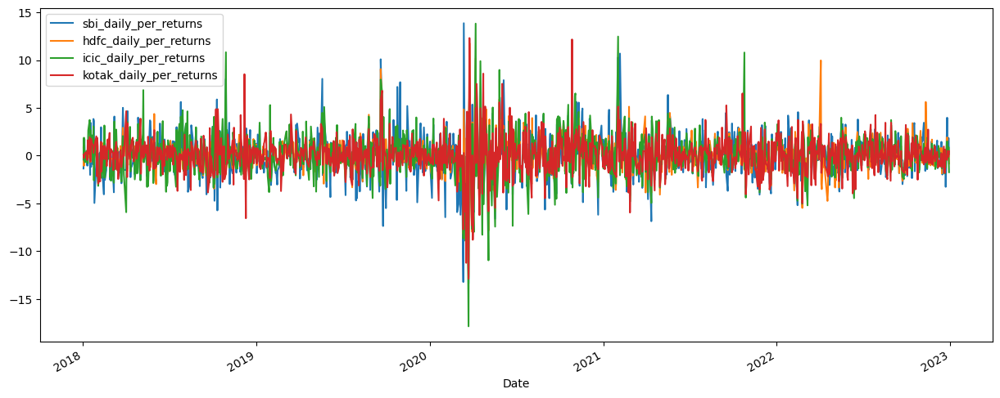

In [52]:
daily_per_return.plot(figsize=(15,6))

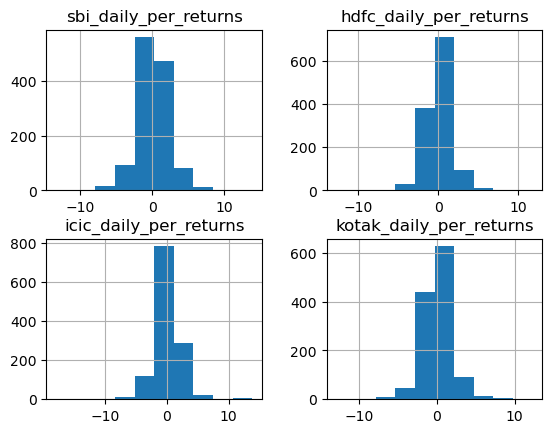

In [53]:
daily_per_return.hist();

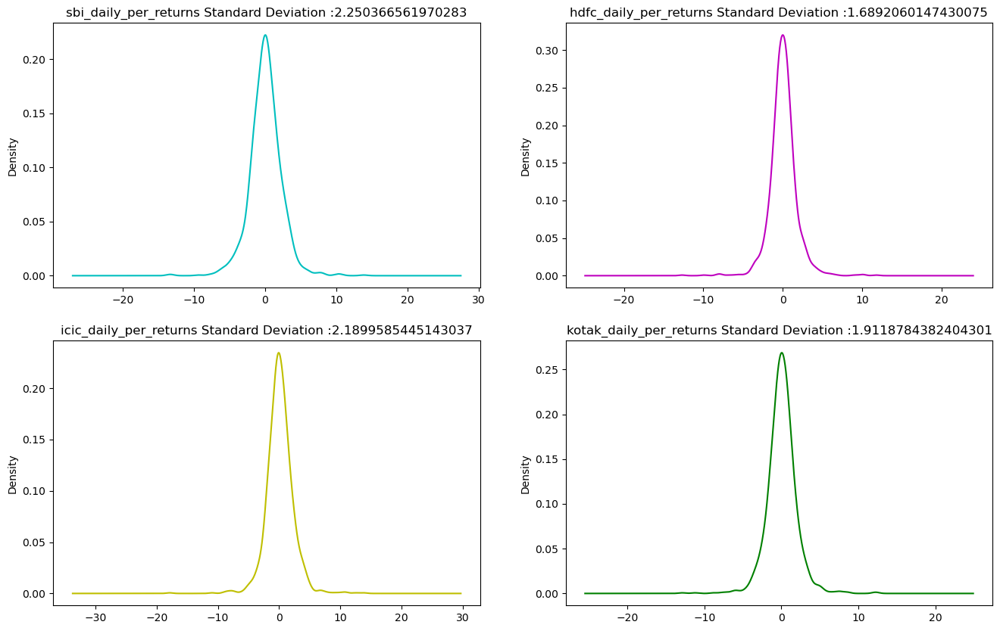

In [54]:
plt.figure(figsize=(16,10))
for index, col in enumerate(daily_per_return.columns,1):
    plt.subplot(2,2,index)
    std= daily_per_return[col].std()
    daily_per_return[col].plot(kind='kde',c=color[index])
    plt.title(col+' '+ 'Standard Deviation :'+ str(std))
    

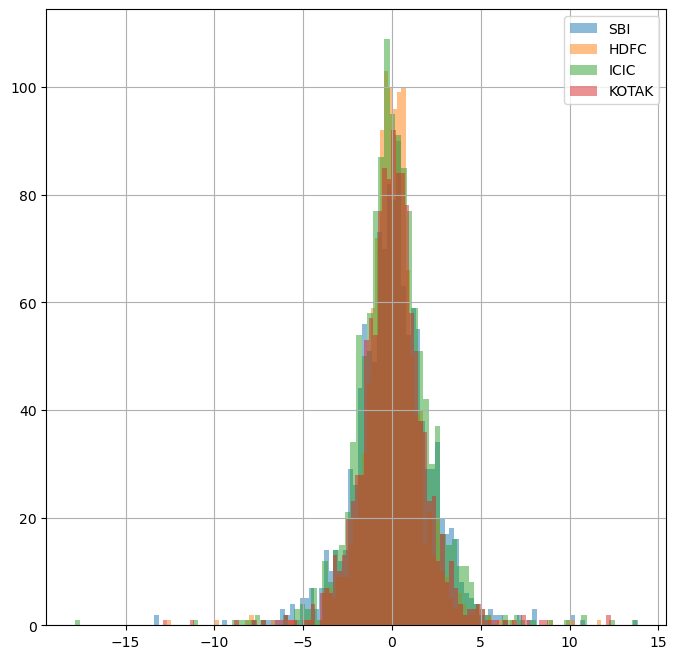

In [55]:
daily_per_return['sbi_daily_per_returns'].hist(bins=100,figsize=(8,8),alpha=0.5,label="SBI")
daily_per_return['hdfc_daily_per_returns'].hist(bins=100,alpha=0.5,label="HDFC")
daily_per_return['icic_daily_per_returns'].hist(bins=100,alpha=0.5,label="ICIC")
daily_per_return['kotak_daily_per_returns'].hist(bins=100,alpha=0.5,label="KOTAK")
plt.legend()

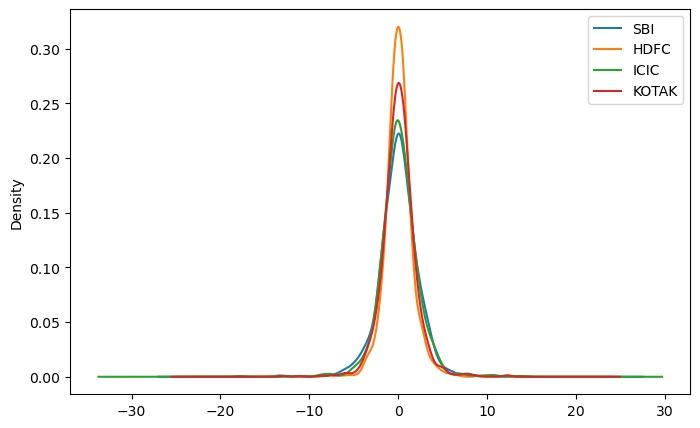

In [56]:
daily_per_return['sbi_daily_per_returns'].plot(kind='kde',figsize=(8,5),label="SBI")
daily_per_return['hdfc_daily_per_returns'].plot(kind='kde',label="HDFC")
daily_per_return['icic_daily_per_returns'].plot(kind='kde',label="ICIC")
daily_per_return['kotak_daily_per_returns'].plot(kind='kde',label="KOTAK")
plt.legend()
plt.show()

<Axes: >

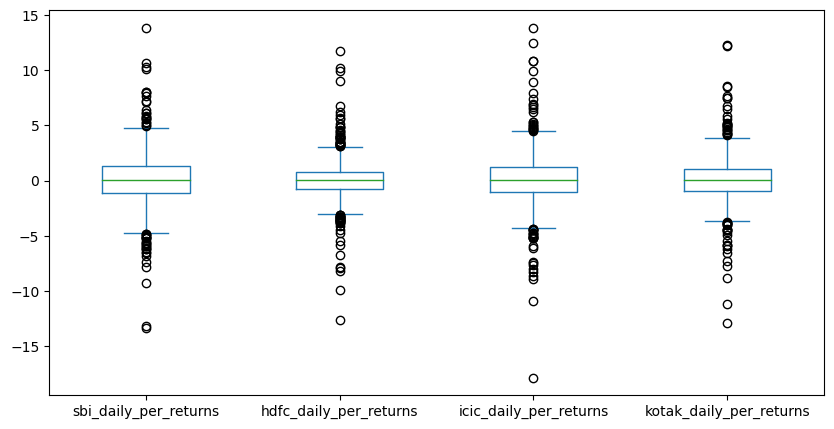

In [57]:
daily_per_return.plot(kind='box',figsize=(10,5))

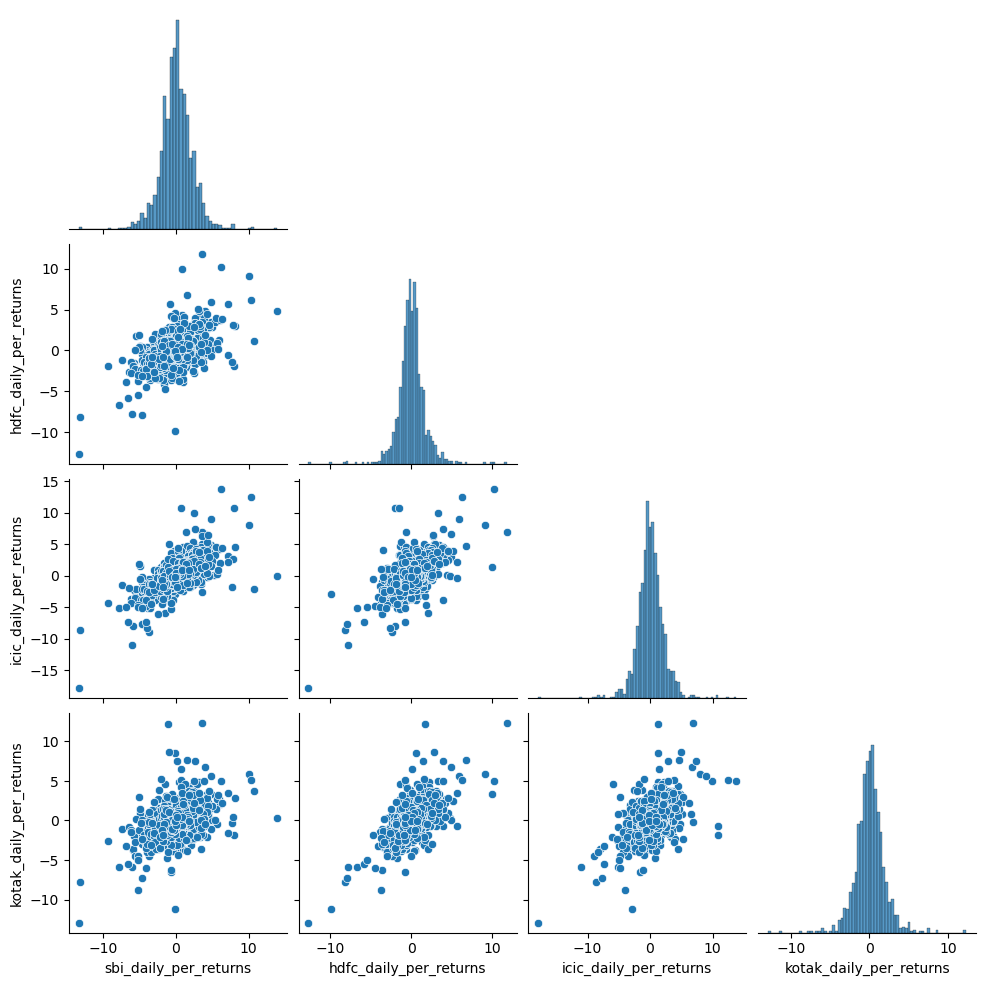

In [58]:
sns.pairplot(daily_per_return,corner=True)

<Axes: >

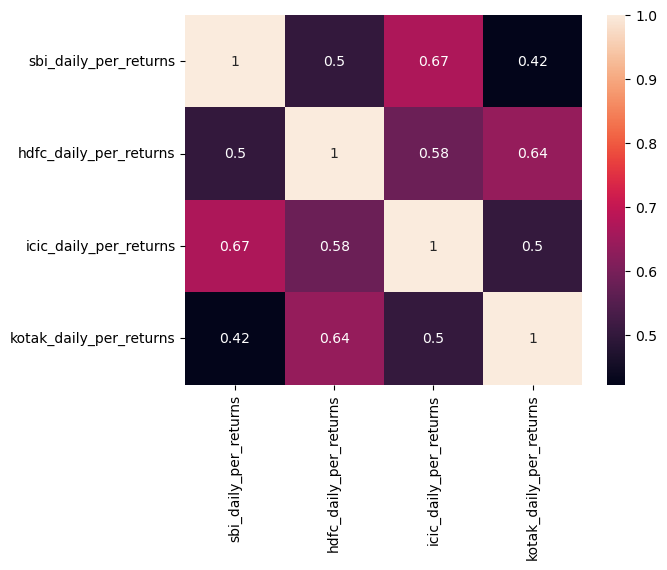

In [59]:
sns.heatmap(daily_per_return.corr(),annot=True)

## Cumulative Daily Returns

In [60]:
cum_per_return=pd.DataFrame()

In [61]:
cum_per_return['sbi_cum_return']=sbi['Close']/sbi['Close'][0]
cum_per_return['hdfc_cum_return']=hdfc['Close']/hdfc['Close'][0]
cum_per_return['icic_cum_return']=icic['Close']/icic['Close'][0]
cum_per_return['kotak_cum_return']=kotak['Close']/kotak['Close'][0]

In [62]:
cum_per_return.index=all_bank.index[:1236]
cum_per_return.head()

,sbi_cum_return,hdfc_cum_return,icic_cum_return,kotak_cum_return
Date,,,,
2018-01-01,1.000000,1.000000,1.000000,1.000000
2018-01-02,0.986484,1.008454,0.995814,1.000948
2018-01-03,0.986322,0.997658,1.014490,0.998403
2018-01-04,1.003257,1.000162,1.013685,0.998652
2018-01-05,0.997232,1.001858,1.006601,1.001398


In [63]:
#cum_per_return.plot(figsize=(15,6))
fig=px.line(cum_per_return,title='Cummulative Percentage Return')
fig.update_layout(
    title={
        'text': "Cummulative % Return of All Stock",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

## Finding Daily Percent change  correlation

In [64]:
daily_return_df=pd.DataFrame()

In [65]:
daily_return_df['sbi_Return']=((sbi['Close']-sbi['Open'])/sbi['Close'])*100
daily_return_df['hdfc_Return']=((hdfc['Close']-hdfc['Open'])/hdfc['Close'])*100
daily_return_df['icic_Return']=((icic['Close']-icic['Open'])/icic['Close'])*100
daily_return_df['kotak_Return']=((kotak['Close']-kotak['Open'])/kotak['Close'])*100

In [66]:
daily_return_df.head()

,sbi_Return,hdfc_Return,icic_Return,kotak_Return
0,-0.960760,-0.861605,-0.466917,-0.134775
1,-1.716742,0.833021,-0.307199,-0.239380
2,-0.676899,-1.152402,1.602916,0.504974
3,1.314718,-0.037687,-0.063536,-0.569830
4,-1.567599,0.077936,-0.207932,-0.089729


In [67]:
daily_return_df.describe().T

,count,mean,std,min,25%,50%,75%,max
sbi_Return,1236.0,-0.173378,2.053528,-10.132155,-1.319290,-0.160347,0.984721,17.151704
hdfc_Return,1236.0,-0.089949,1.489094,-12.692089,-0.763295,-0.050107,0.663503,9.999414
icic_Return,1236.0,-0.041644,1.845243,-10.399344,-1.010276,-0.064953,0.953189,9.506541
kotak_Return,1236.0,-0.065670,1.785179,-12.540492,-0.989529,-0.090358,0.887938,12.328027


<Axes: >

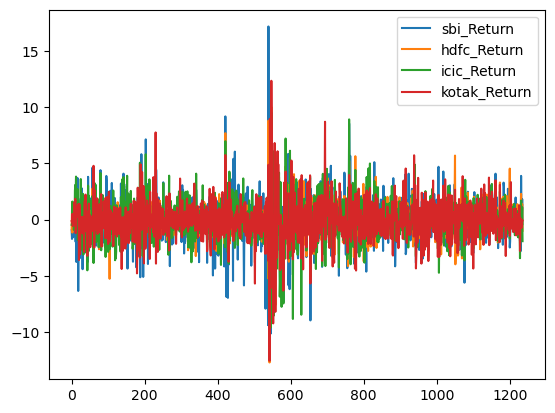

In [68]:
daily_return_df.plot()

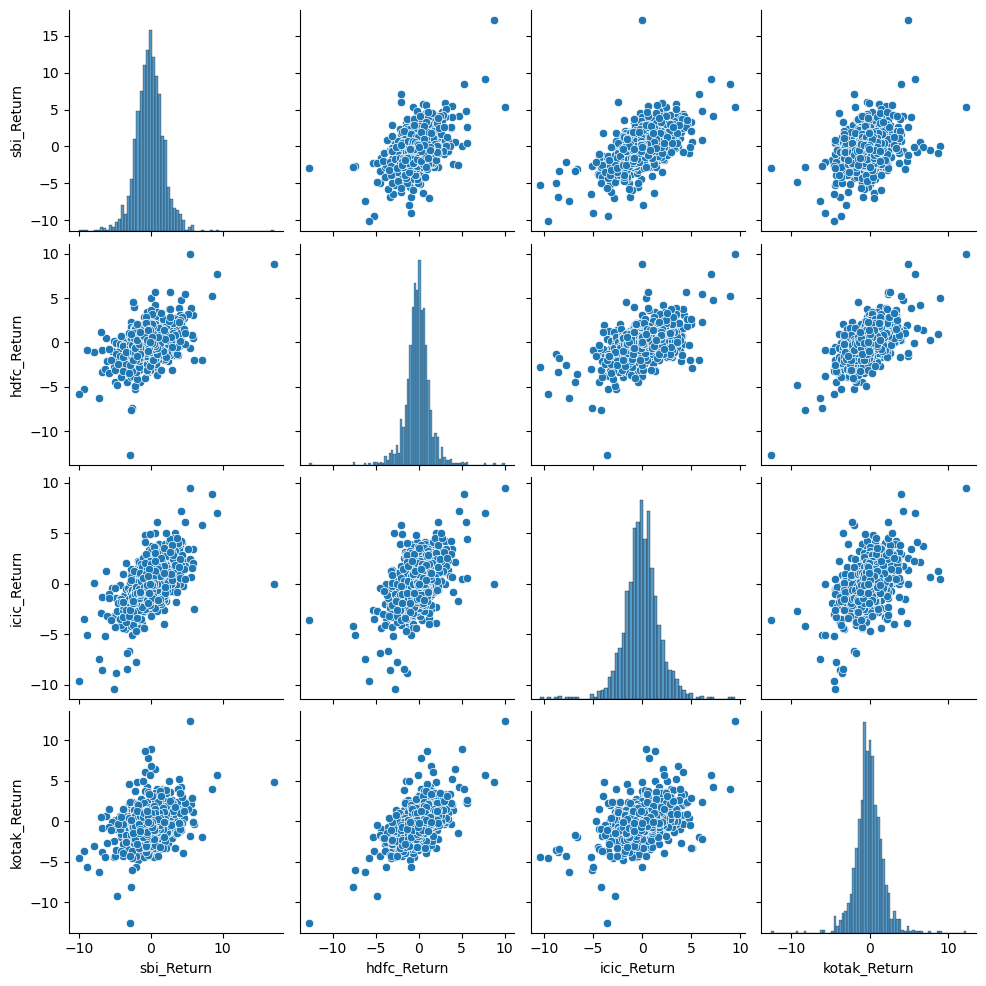

In [69]:
sns.pairplot(daily_return_df)

<Axes: >

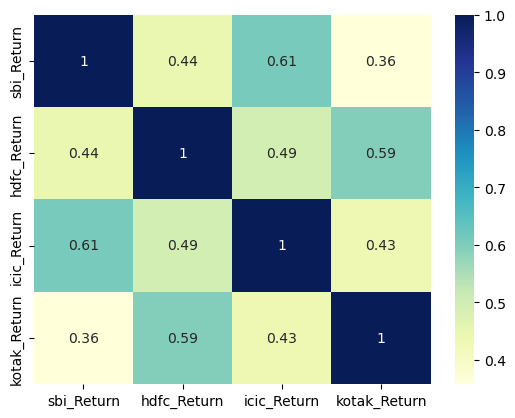

In [70]:
sns.heatmap(daily_return_df.corr(), annot=True,cmap="YlGnBu")

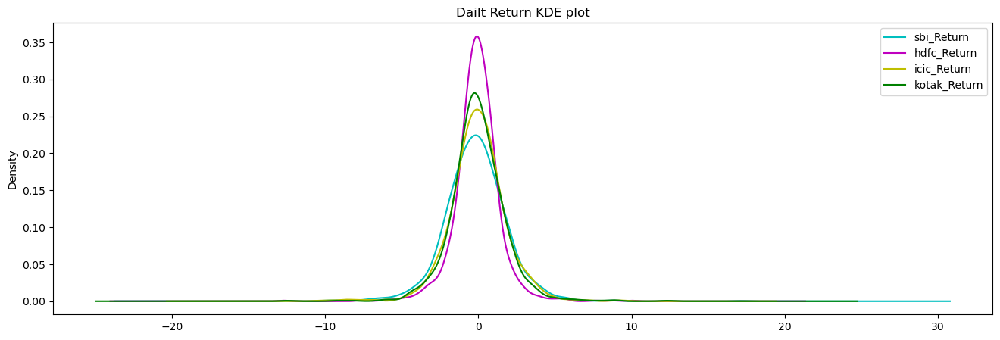

In [129]:
plt.figure(figsize=(16,5))
for index, col in enumerate(daily_return_df.columns,1):
    #plt.subplot(2,2,index)
    std= daily_return_df[col].std()
    daily_return_df[col].plot(kind='kde',c=color[index],label=col)
    plt.title("Dailt Return KDE plot")
    plt.legend()

    

In [72]:
daily_return_df.columns

Index(['sbi_Return', 'hdfc_Return', 'icic_Return', 'kotak_Return'], dtype='object')

# SBIN Stock 

In [73]:
sbi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1236 entries, 0 to 1235
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       1236 non-null   object 
 1   Open       1236 non-null   float64
 2   High       1236 non-null   float64
 3   Low        1236 non-null   float64
 4   Close      1236 non-null   float64
 5   Adj Close  1236 non-null   float64
 6   Volume     1236 non-null   int64  
 7   Name       1236 non-null   object 
dtypes: float64(5), int64(1), object(2)
memory usage: 77.4+ KB


In [74]:
sbi.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'Name'], dtype='object')

In [75]:
fig=px.line(sbi,x="Date",y=['Open', 'High', 'Low', 'Close'],template='plotly_white')
fig.show()

## SBIN stock -Analyzing different rolling mean with closing price

In [122]:
sbi['10-day_moving_avg']=sbi['Close'].rolling(window=10).mean()
sbi['20-day_moving_avg']=sbi['Close'].rolling(window=20).mean()
sbi['30-day_moving_avg']=sbi['Close'].rolling(window=30).mean()
sbi['50-day_moving_avg']=sbi['Close'].rolling(window=50).mean()
fig=px.line(sbi,x="Date",y=['Close','10-day_moving_avg', '20-day_moving_avg', '30-day_moving_avg','50-day_moving_avg'],template='plotly_dark',width=1000, height=500)
fig.show()

In [77]:
sbi['Date']=pd.to_datetime(sbi['Date'])
last_2yr=sbi[sbi['Date'].dt.year==2022]

## Candlestick Plot

In [78]:
import chart_studio.plotly as py
import plotly.figure_factory as ff


from plotly.offline import download_plotlyjs,init_notebook_mode,iplot
init_notebook_mode(connected=True)

In [79]:
trace=go.Candlestick(x=last_2yr["Date"],open= last_2yr['Open'].values.tolist(),high= last_2yr['High'].values.tolist(),low= last_2yr['Low'].values.tolist(),close= last_2yr['Close'].values.tolist()) 
data=[trace]
fig=go.Figure(data)
fig.show()

## HDFC Bank

In [80]:
hdfc.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Name
0,01 January 2018,936.500000,940.099976,925.049988,928.500000,890.247070,83306,HDFCBANK
1,02 January 2018,928.549988,937.625000,928.549988,936.349976,897.773682,90374,HDFCBANK
2,03 January 2018,937.000000,938.674988,925.349976,926.325012,888.161743,88928,HDFCBANK
3,04 January 2018,929.000000,933.049988,927.500000,928.650024,890.390991,46494,HDFCBANK
4,05 January 2018,929.500000,934.299988,916.474976,930.224976,891.901001,213516,HDFCBANK


In [81]:
hdfc.describe().T

,count,mean,std,min,25%,50%,75%,max
Open,1236.0,1254.436813,221.580349,770.000000,1054.500000,1240.000000,1462.537537,1.709950e+03
High,1236.0,1266.269234,223.391985,825.000000,1062.518768,1247.750000,1478.774963,1.724300e+03
Low,1236.0,1240.978622,220.705794,738.900024,1045.743744,1226.700012,1449.687531,1.671150e+03
Close,1236.0,1253.606167,222.244628,765.450012,1054.043793,1237.849976,1464.700012,1.688950e+03
Adj Close,1236.0,1220.927693,223.514232,744.848145,1018.573928,1204.022766,1433.916077,1.650607e+03
Volume,1236.0,389538.483819,535545.271765,0.000000,138627.500000,235049.000000,432969.250000,6.497924e+06


In [82]:
fig=px.line(hdfc,x="Date",y=['Open', 'High', 'Low', 'Close'],template='plotly_white')
fig.show()

## HDFC bank stock -Analyzing different rolling mean with closing price

In [83]:
hdfc['10-day_moving_avg']=hdfc['Close'].rolling(window=10).mean()
hdfc['20-day_moving_avg']=hdfc['Close'].rolling(window=20).mean()
hdfc['30-day_moving_avg']=hdfc['Close'].rolling(window=30).mean()
hdfc['50-day_moving_avg']=hdfc['Close'].rolling(window=50).mean()
fig=px.line(hdfc,x="Date",y=['Close','10-day_moving_avg', '20-day_moving_avg', '30-day_moving_avg','50-day_moving_avg'],template='plotly_dark',width=1000, height=500)
fig.show()

In [84]:
hdfc['Date']=pd.to_datetime(hdfc['Date'])
last_2yr=sbi[hdfc['Date'].dt.year>2020]

## Candlestick Plot

In [85]:
trace=go.Candlestick(x=last_2yr["Date"],open= last_2yr['Open'].values.tolist(),high= last_2yr['High'].values.tolist(),low= last_2yr['Low'].values.tolist(),close= last_2yr['Close'].values.tolist()) 
data=[trace]
fig=go.Figure(data)
fig.show()

## ICIC bank

In [86]:
icic.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Name
0,01 January 2018,312.000000,313.899994,309.100006,310.549988,301.562561,502603,ICICBANK
1,02 January 2018,310.200012,311.850006,307.750000,309.250000,300.300171,570898,ICICBANK
2,03 January 2018,310.000000,316.500000,310.000000,315.049988,305.932312,523165,ICICBANK
3,04 January 2018,315.000000,315.750000,311.500000,314.799988,305.689545,451538,ICICBANK
4,05 January 2018,313.250000,315.149994,311.700012,312.600006,303.553253,432210,ICICBANK


In [87]:
icic.describe().T

,count,mean,std,min,25%,50%,75%,max
Open,1236.0,5.239945e+02,1.936588e+02,260.500000,355.000000,473.300003,7.031750e+02,9.530000e+02
High,1236.0,5.303728e+02,1.947872e+02,264.399994,359.837502,479.500000,7.087000e+02,9.580000e+02
Low,1236.0,5.174125e+02,1.927966e+02,256.500000,350.249992,466.699997,6.943875e+02,9.410000e+02
Close,1236.0,5.239638e+02,1.939100e+02,259.299988,354.500000,471.849991,7.022000e+02,9.534000e+02
Adj Close,1236.0,5.193543e+02,1.950102e+02,251.795746,349.969856,467.667160,6.980123e+02,9.534000e+02
Volume,1236.0,1.099804e+06,1.521656e+06,0.000000,404026.750000,682601.500000,1.284480e+06,3.099254e+07


In [88]:
fig=px.line(icic,x="Date",y=['Open', 'High', 'Low', 'Close'],template='plotly_white')
fig.show()

## ICIC bank stock -Analyzing different rolling mean with closing price

In [89]:
icic['10-day_moving_avg']=icic['Close'].rolling(window=10).mean()
icic['20-day_moving_avg']=icic['Close'].rolling(window=20).mean()
icic['30-day_moving_avg']=icic['Close'].rolling(window=30).mean()
icic['50-day_moving_avg']=icic['Close'].rolling(window=50).mean()
fig=px.line(icic,x="Date",y=['Close','10-day_moving_avg', '20-day_moving_avg', '30-day_moving_avg','50-day_moving_avg'],template='plotly_dark',width=1000, height=500)
fig.show()

## Candlestick Plot

In [90]:
icic['Date']=pd.to_datetime(icic['Date'])
last_2yr=sbi[icic['Date'].dt.year>2020]

trace=go.Candlestick(x=last_2yr["Date"],open= last_2yr['Open'].values.tolist(),high= last_2yr['High'].values.tolist(),low= last_2yr['Low'].values.tolist(),close= last_2yr['Close'].values.tolist()) 
data=[trace]
fig=go.Figure(data)
fig.show()

## KOTAKBANK Analysis

In [91]:
kotak.head()

,Date,Open,High,Low,Close,Adj Close,Volume,Name
0,01 January 2018,1003.000000,1014.349976,1000.000000,1001.650024,999.501038,23396,KOTAKBANK
1,02 January 2018,1005.000000,1005.849976,994.000000,1002.599976,1000.449036,42904,KOTAKBANK
2,03 January 2018,995.000000,1010.349976,995.000000,1000.049988,997.904480,44891,KOTAKBANK
3,04 January 2018,1006.000000,1006.000000,996.549988,1000.299988,998.153992,39046,KOTAKBANK
4,05 January 2018,1003.950012,1005.950012,996.950012,1003.049988,1000.898071,75973,KOTAKBANK


In [92]:
kotak.describe().T

,count,mean,std,min,25%,50%,75%,max
Open,1236.0,1562.826820,2.898074e+02,995.000000,1305.074982,1613.025024,1814.250000,2.204900e+03
High,1236.0,1581.233818,2.921652e+02,1005.849976,1319.712494,1629.250000,1829.225006,2.252450e+03
Low,1236.0,1542.259630,2.882092e+02,992.500000,1283.287476,1590.000000,1788.199982,2.177650e+03
Close,1236.0,1562.115938,2.899341e+02,1000.049988,1303.049988,1613.850036,1811.912537,2.210550e+03
Adj Close,1236.0,1560.480443,2.902770e+02,997.904480,1301.006988,1612.077820,1810.859192,2.209219e+03
Volume,1236.0,276232.262945,2.091552e+06,0.000000,60600.000000,111522.500000,187855.750000,5.667590e+07


In [93]:
fig=px.line(kotak,x="Date",y=['Open', 'High', 'Low', 'Close'],template='plotly_white')
fig.show()

## Kotak bank stock -Analyzing different rolling mean with closing price

In [94]:
kotak['10-day_moving_avg']=kotak['Close'].rolling(window=10).mean()
kotak['20-day_moving_avg']=kotak['Close'].rolling(window=20).mean()
kotak['30-day_moving_avg']=kotak['Close'].rolling(window=30).mean()
kotak['50-day_moving_avg']=kotak['Close'].rolling(window=50).mean()
fig=px.line(kotak,x="Date",y=['Close','10-day_moving_avg', '20-day_moving_avg', '30-day_moving_avg','50-day_moving_avg'],template='plotly_dark',width=1000, height=500)
fig.show()

## Candlestick Plot

In [95]:
kotak['Date']=pd.to_datetime(kotak['Date'])
last_2yr=sbi[kotak['Date'].dt.year>2020]

In [96]:
trace=go.Candlestick(x=last_2yr["Date"],open= last_2yr['Open'].values.tolist(),high= last_2yr['High'].values.tolist(),low= last_2yr['Low'].values.tolist(),close= last_2yr['Close'].values.tolist()) 
data=[trace]
fig=go.Figure(data)
fig.show()

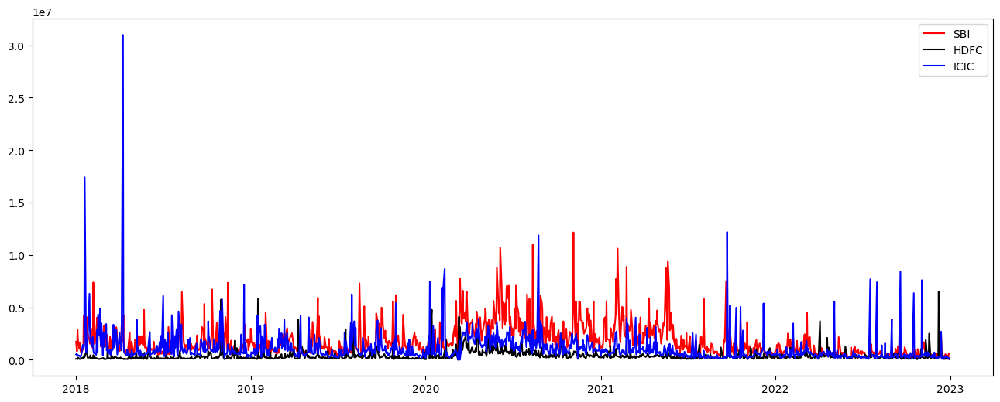

In [97]:
plt.figure(figsize=(16,6))
plt.plot(sbi['Date'],sbi['Volume'],c='r',label='SBI')
plt.plot(hdfc['Date'],hdfc['Volume'],c='k',label="HDFC")
plt.plot(icic['Date'],icic['Volume'],c='b',label='ICIC')
plt.legend()

# Forecasting

In [98]:
from prophet import Prophet

In [99]:
m=Prophet()

# SBI bank Forescasting

In [102]:
df_sbi=sbi[['Date','Close']]

In [104]:
df_sbi['Date']=pd.to_datetime(df_sbi['Date'])

In [105]:
df_sbi.columns=['ds','y']
df_sbi.head()

,ds,y
0,2018-01-01,307.049988
1,2018-01-02,302.899994
2,2018-01-03,302.850006
3,2018-01-04,308.049988
4,2018-01-05,306.200012


In [106]:
m.fit(df_sbi)

12:11:28 - cmdstanpy - INFO - Chain [1] start processing
12:11:29 - cmdstanpy - INFO - Chain [1] done processing


### Six month forecast

In [107]:
sbi_future_price=m.make_future_dataframe(periods=180)

In [108]:
sbi_future_price.shape

(1416, 1)

In [109]:
sbi_stock_forecast=m.predict(sbi_future_price)

In [121]:
sbi_stock_forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2018-01-01,258.613625,262.005938,319.652746,258.613625,258.613625,31.155954,31.155954,31.155954,6.566427,6.566427,6.566427,24.589527,24.589527,24.589527,0.0,0.0,0.0,289.769579
1,2018-01-02,258.688338,263.780479,320.119850,258.688338,258.688338,32.006406,32.006406,32.006406,6.846515,6.846515,6.846515,25.159891,25.159891,25.159891,0.0,0.0,0.0,290.694744
2,2018-01-03,258.763050,262.988414,321.647325,258.763050,258.763050,32.671415,32.671415,32.671415,6.967291,6.967291,6.967291,25.704123,25.704123,25.704123,0.0,0.0,0.0,291.434465
3,2018-01-04,258.837763,261.823201,319.037121,258.837763,258.837763,33.298651,33.298651,33.298651,7.085727,7.085727,7.085727,26.212924,26.212924,26.212924,0.0,0.0,0.0,292.136414
4,2018-01-05,258.912476,263.167257,319.411966,258.912476,258.912476,32.425360,32.425360,32.425360,5.746984,5.746984,5.746984,26.678377,26.678377,26.678377,0.0,0.0,0.0,291.337836


In [111]:
q=sbi_stock_forecast[['ds','yhat_lower','yhat_upper','yhat']].tail(180)
q

,ds,yhat_lower,yhat_upper,yhat
1236,2022-12-31,552.099485,609.897443,580.698075
1237,2023-01-01,545.163864,600.142780,572.230184
1238,2023-01-02,573.653676,628.639161,600.937431
1239,2023-01-03,574.903798,629.458373,602.056516
1240,2023-01-04,572.778448,630.096104,602.983062
...,...,...,...,...
1411,2023-06-24,534.298688,640.154475,586.958827
1412,2023-06-25,523.231548,631.813423,577.957858
1413,2023-06-26,555.301263,662.221168,606.224704
1414,2023-06-27,554.346912,660.213887,607.005281


In [112]:
# actual value of stock
df2=pd.read_csv("sbi2023.csv",parse_dates=True,index_col="Date")
df2.head()

,Open Price,High Price,Low Price,Close Price,WAP,No.of Shares,No. of Trades,Total Turnover (Rs.),Deliverable Quantity,% Deli. Qty to Traded Qty,Spread High-Low,Spread Close-Open
Date,,,,,,,,,,,,
2023-01-02,615.00,619.25,611.50,612.25,614.330596,189984,4986,116712984,56159,29.56,7.75,-2.75
2023-01-03,612.55,616.65,610.05,612.35,613.591132,322698,8607,198004631,114623,35.52,6.60,-0.20
2023-01-04,612.35,615.00,603.80,605.25,608.839422,212339,4861,129280354,83458,39.30,11.20,-7.10
2023-01-05,607.90,611.50,602.05,605.20,606.187551,319390,9502,193610242,98741,30.92,9.45,-2.70
2023-01-06,606.10,607.45,597.00,600.60,601.092073,362496,12093,217893472,165774,45.73,10.45,-5.50


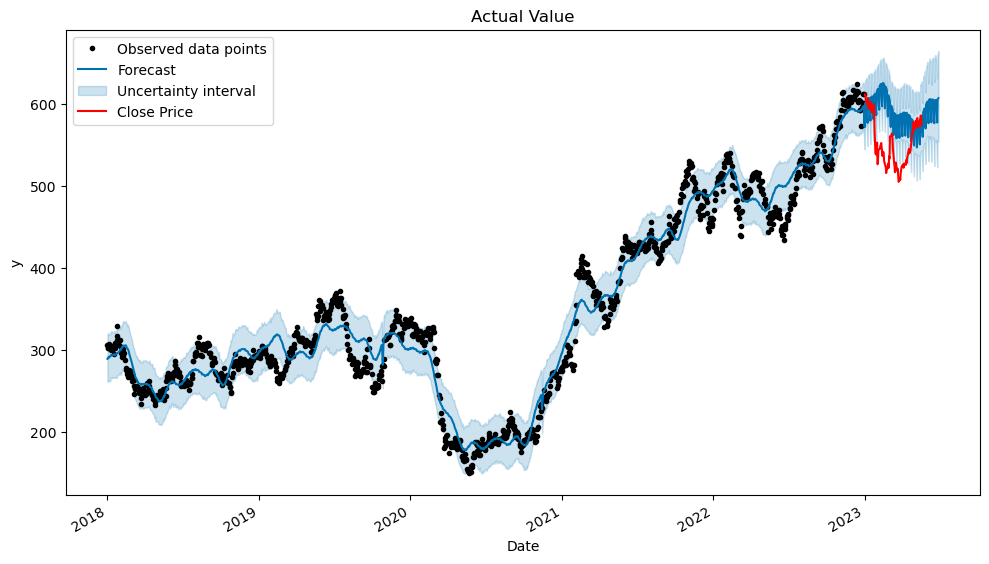

In [113]:
m.plot(sbi_stock_forecast)
df2['Close Price'].plot(c='r',title='Actual Value')
plt.legend()

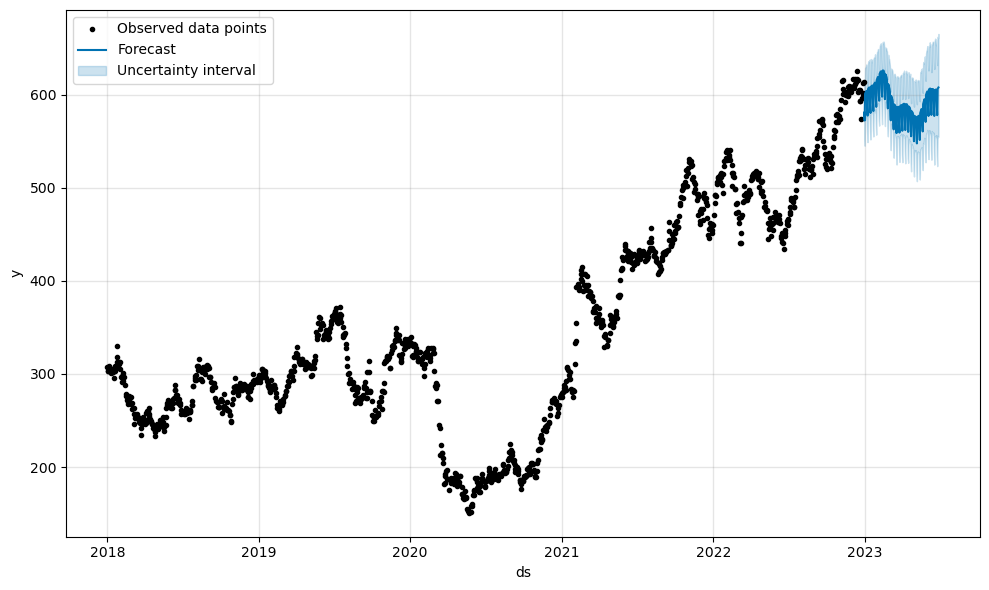

In [114]:
m.plot(q)
plt.legend()

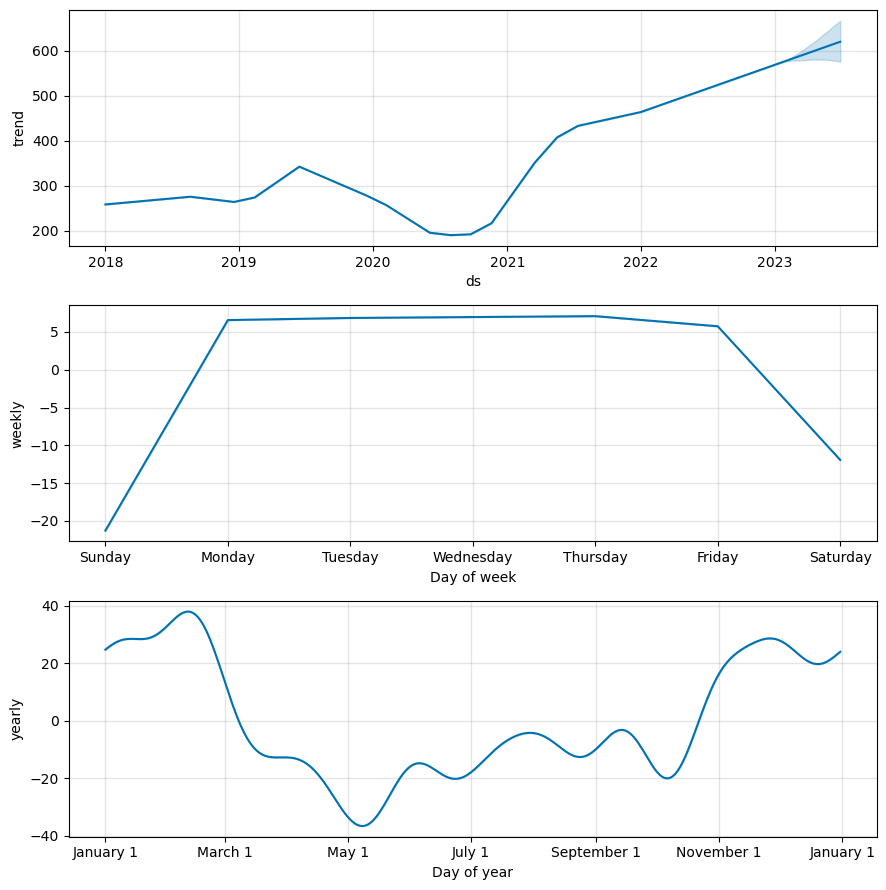

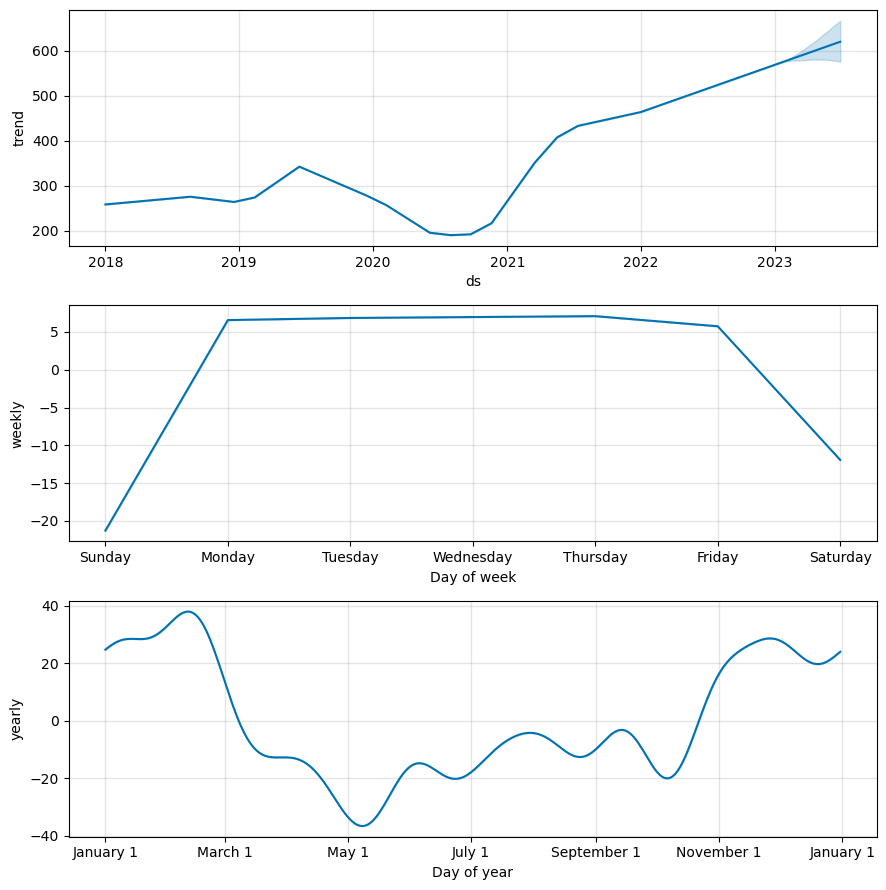

In [115]:
m.plot_components(sbi_stock_forecast)